<a href="https://colab.research.google.com/github/kinsebcela/dog-breed-identification/blob/main/Dog_Vision_AI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐕 End-to-end Dog Vision AI Project

This notebook builds an end-to-end multi class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identyfying the breed of the dog given an image of a dog.

When I'm sitting at a cafe and I take a photo of a dog I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition dataset.

https://www.kaggle.com/c/dog-breed-identification/overview

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's best we use deep learning and trasnfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes)
* There are 10,000+ images in the training set (these images have labels)
* There are 10,000+ images in the test set (these images do not have label becuse we'll want to predict them)

## Get our workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [ ]:
# Import TensorFlow and TensorFlow Hub
import tensorflow as tf
import tensorflow_hub as hub

# Check for GPU availability
print('GPU', 'available (YESSSS!!!!!)' if tf.config.list_physical_devices('GPU') else 'No GPU connected')

GPU available (YESSSS!!!!!)


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our data into Tensors (numerical respresntations).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Check the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


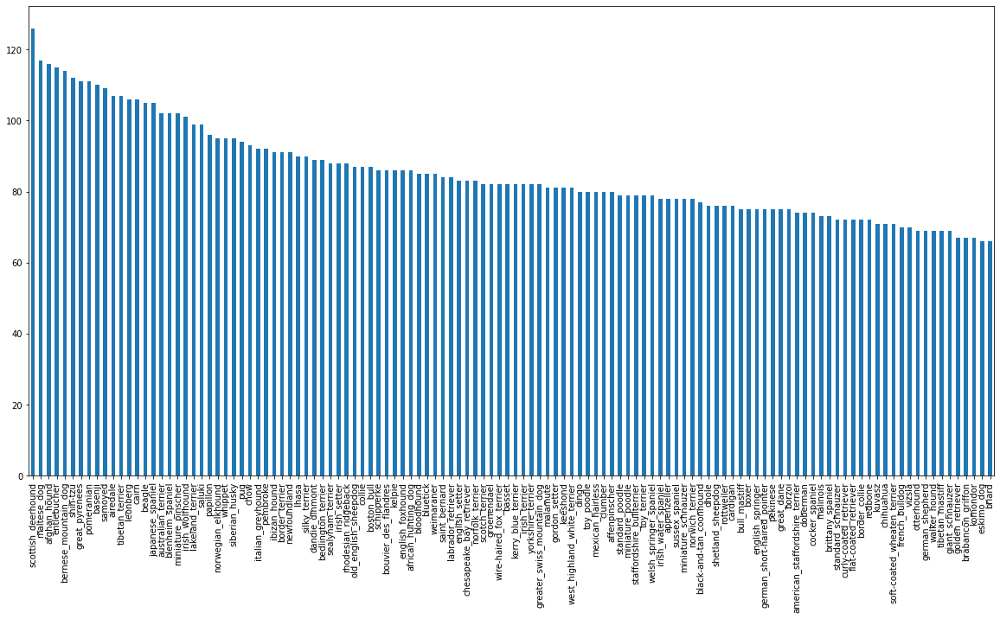

In [ ]:
# How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

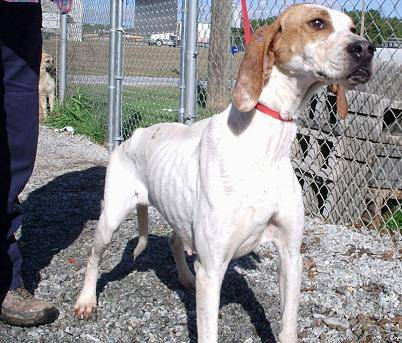

In [ ]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/train/0067dc3eab0b3c3ef0439477624d85d6.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [ ]:
# Create pathnames from image ID's
filenames = ["drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/" + fname + '.jpg' for fname in labels_csv['id']]

# Check for first 10
filenames[:10]

['drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/0042188c8

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir('drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/')) == len(filenames):
  print('Filenames match actual number of files. Proceed!!!!')
else:
  print('Filenames DO NOT MATCH actual number of files')

Filenames match actual number of files. Proceed!!!!


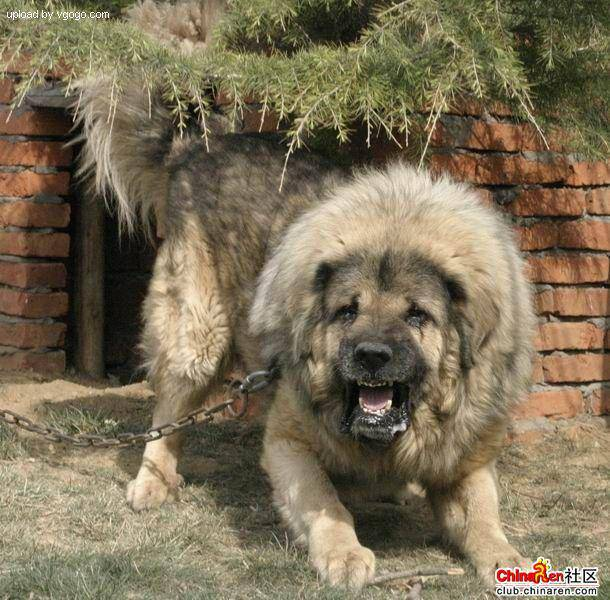

In [ ]:
# One more check to see if data is in the right folder. Let's index a radnome number
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since we've got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
# labels = np.array(labels_csv) # does the same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print('Number of labels matches number of filenames!')
else:
  print('Number of labels does not match number of filenames!')

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/0042188c8

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: 'slider', min:1000, max:10000, step: 1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:2]

(['drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog-Vision-Data/dog-breed-identification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, Fal

## Preprocessing Images (turning image into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a .jpg) into Tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modified `image`

Before we do let's see what importing an image looks like.

In [ ]:
# Convert image to a NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.min(), image.max()

(0, 255)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now that we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a .jpg) into Tensors
4. Normalize our image (convert color values from 0-255 to 0-1 values)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preproscessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpg image into numerical Tensor with a 3 color channel (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ image in one go... they might not fit into the memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if needed)

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
(`image`, `label`)

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, 
  processes the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now that we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (`X` & `y`) into batches.

In [ ]:
# Define a batch size, 32 is a good start.
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, 
                        y=None, 
                        batch_size=BATCH_SIZE, 
                        valid_data=False, 
                        test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test dat as input (no labels).
  """
  # If the data is a test data set, we probably don't have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only file paths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a validation dataset, we don't need to shuffle it
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  
  else:
    print('Creating training data batches...')
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function
    # is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however these can be a little hard to understand, let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a batch data
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image lable as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    # plt.axis('off')

In [ ]:
y[0].argmax()

19

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

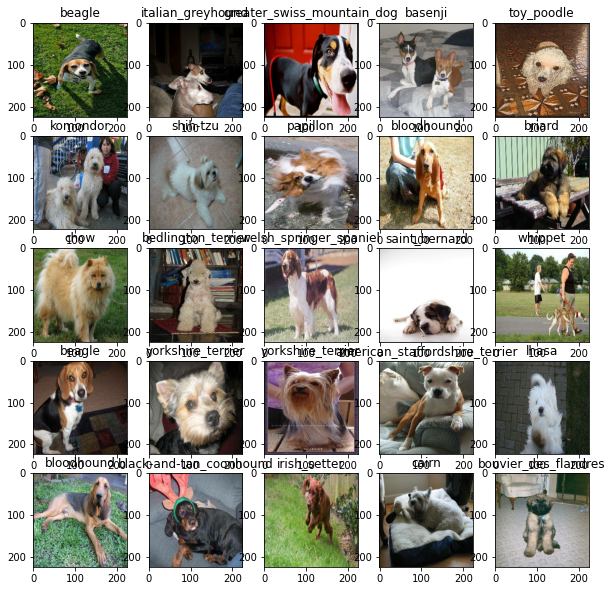

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

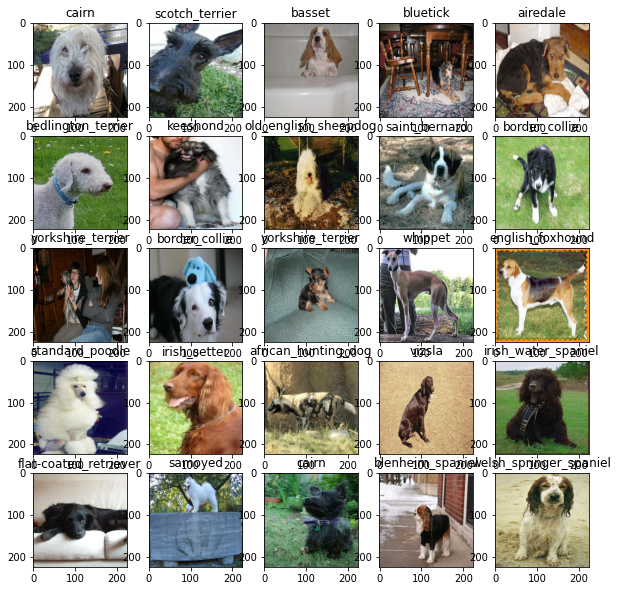

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from tensorFlow Hub
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now that we've got our inputes, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this let's create function which:
* Takes the input hsape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that)
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model

In [ ]:
# Create a function which build a Keras model
def create_model(input_shape=INPUT_SHAPE, 
                 output_shape=OUTPUT_SHAPE, 
                 model_url=MODEL_URL):
  print('Building model with:', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation='softmax') # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1, 1, 1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents models from training too long.

### TensorBoard callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function ✅
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training) ✅

In [ ]:
# Load TensorBoard notebook extentsion
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/logs',
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)


### Early Stopping Callback

Early stopping helps our model stop overfitting by stopping training 
if a certain evaluation metric stops improving.

In [ ]:
# Create eaarly stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100}

# Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs and the callback we'd like to use.
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 135s 4s/step - loss: 4.5170 - accuracy: 0.0950 - val_loss: 3.3327 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 4s 141ms/step - loss: 1.5933 - accuracy: 0.7138 - val_loss: 2.1746 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 4s 162ms/step - loss: 0.5438 - accuracy: 0.9400 - val_loss: 1.6630 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 4s 161ms/step - loss: 0.2385 - accuracy: 0.9900 - val_loss: 1.4786 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 4s 159ms/step - loss: 0.1410 - accuracy: 0.9987 - val_loss: 1.3988 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 3s 135ms/step - loss: 0.0970 - accuracy: 1.0000 - val_loss: 1.3724 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================]

**Warning!** Model is overfitting because it is performing far better in the training set than the validation set.

**Note!** Overfitting is a good thing to begin with. It means te model is learning.

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs we created
and visualize its contents

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/logs"

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 113ms/step


array([[2.12282059e-03, 2.64294853e-04, 3.67786997e-04, ...,
        1.22656784e-04, 2.41619728e-05, 1.28030265e-03],
       [5.11090551e-03, 2.93813832e-03, 3.62326093e-02, ...,
        4.18837211e-04, 3.18232644e-03, 3.81462771e-04],
       [2.26543762e-05, 1.67635182e-04, 2.14299725e-04, ...,
        1.37967523e-04, 1.09040906e-04, 8.07536708e-05],
       ...,
       [8.80926382e-06, 3.84289124e-05, 5.41279078e-05, ...,
        1.12521382e-04, 1.12497131e-04, 3.29199189e-04],
       [5.11234393e-03, 2.76122533e-04, 4.37976814e-05, ...,
        1.83826938e-04, 5.33004786e-05, 1.72988027e-02],
       [3.87887958e-05, 5.93865734e-05, 6.24581124e-04, ...,
        2.84151058e-03, 4.65854158e-04, 1.09462044e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val), len(unique_breeds)

(200, 120)

In [ ]:
np.sum(predictions[0]), np.sum(predictions[1])

(1.0, 1.0)

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[2.64891805e-05 6.08372393e-05 5.65342343e-05 3.22285850e-05
 1.27774745e-03 1.35457638e-04 7.25641148e-05 1.77475531e-03
 8.40533245e-03 2.56628860e-02 2.95735117e-05 1.07861160e-05
 1.10806643e-04 7.34428829e-03 2.46059004e-04 1.66794716e-03
 7.52560754e-06 7.92732055e-04 1.48671126e-04 2.53451057e-04
 1.04696628e-04 3.17179452e-04 2.04355674e-05 8.45269551e-06
 2.38677789e-03 3.57927893e-05 2.45197334e-05 5.39064167e-05
 4.61047748e-05 2.37555068e-05 7.73110951e-05 1.16029922e-04
 7.55862638e-05 5.10532445e-05 1.50309679e-05 2.81804605e-05
 1.41328046e-05 1.41190700e-04 3.45080989e-05 8.82752612e-02
 1.60555719e-04 2.82559722e-05 6.73123682e-03 7.21754532e-06
 1.67912134e-04 8.58942622e-06 4.76112291e-05 7.95564149e-04
 1.24490425e-05 2.52930447e-04 6.65400803e-05 1.04850100e-04
 5.89944975e-05 1.49499904e-03 1.50852375e-05 2.93507735e-04
 7.24834754e-05 1.23426071e-04 8.33945669e-05 2.39129349e-05
 5.68963551e-05 2.17658657e-04 1.08634995e-05 1.18494281e-05
 3.19562532e-05 2.167178

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'golden_retriever'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images adn then compare those to predictions to validation labels (truth labels)

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch the dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors adn returns seperate arrays
  of images and labels
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got ways to get:
* Prediction labels
* Validation labels
* Validation images

Let's create a functions to make these all a bit more visual

We'll create a function which takes:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integers. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #  Change the color of the title depending on the prediction
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # change plot to be predicted, probability of prediction and truth label
  plt.title('{}, {:2.0f}%, {}'.format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

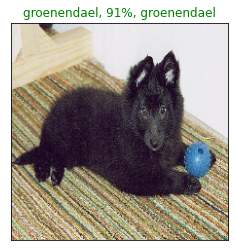

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now that we've got one function to visualize our models prediction, let's make another to view our models top 10 predictions

This function will:
* Take as input of prediciton probabilities array and a ground truth array adn a an integer
* Find the prediciton using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediciton probabilities labels ✅
* Plot the top 10 prediction probability values  adn labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidence along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediciton labesl
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')
  
  # Change the color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

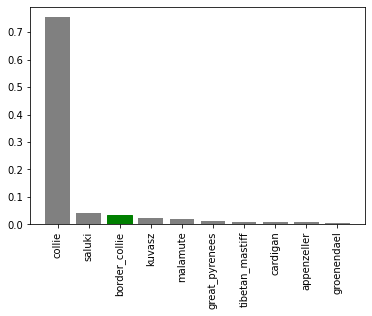

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now that we've got some function to help is visualize our predictions and evaluate p\our model, let's check out a few.

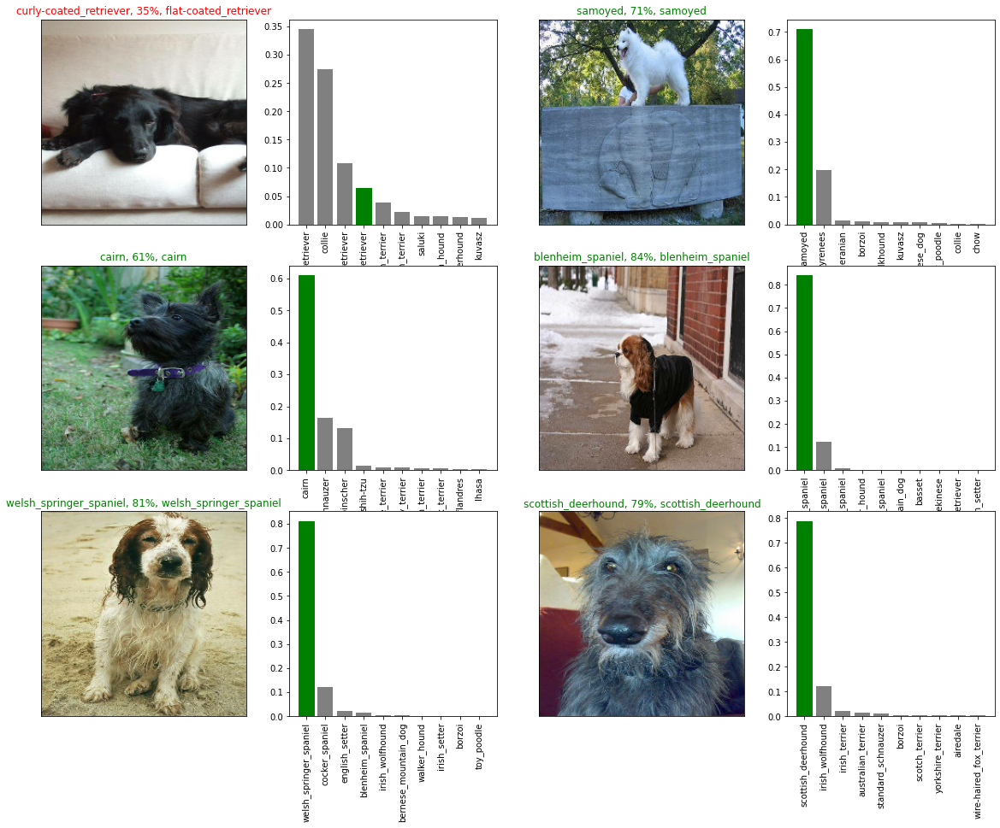

In [ ]:
# Let's check put a few predictions and their values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10 * num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2 * i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(prediction_probabilities=predictions,
            labels=val_labels,
            n=i+i_multiplier)
plt.show()


## Saving and reloading a trained model 

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join('/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/models',
                          datetime.datetime.now().strftime('%Y5m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save format model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specific path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer': hub.KerasLayer})
  return model

Now we,ve got functions to save and load a  trained model, let's make sure they work!


In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/models/20235m02-22101672697409-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/models/20235m02-22101672697409-1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_1000_image_model = load_model('/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/models/20235m01-17451672595129-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/models/20235m01-17451672595129-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-save model
model.evaluate(val_data)

7/7 [==============================] - 1s 91ms/step - loss: 1.2685 - accuracy: 0.6650


[1.268525242805481, 0.6650000214576721]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 96ms/step - loss: 1.2383 - accuracy: 0.6850


[1.2383407354354858, 0.6850000023841858]

## Train the model with the full dataset 🐶

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model 
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

**Note:** Running the cell below will take alittle while (maybe up to 30mins for the first epoch) because the GPU we're using has to laod all the images to memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 42s 122ms/step - loss: 1.3586 - accuracy: 0.6675
Epoch 2/100
320/320 [==============================] - 39s 120ms/step - loss: 0.4007 - accuracy: 0.8815
Epoch 3/100
320/320 [==============================] - 40s 123ms/step - loss: 0.2369 - accuracy: 0.9342
Epoch 4/100
320/320 [==============================] - 42s 131ms/step - loss: 0.1517 - accuracy: 0.9644
Epoch 5/100
320/320 [==============================] - 40s 126ms/step - loss: 0.1047 - accuracy: 0.9797
Epoch 6/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0738 - accuracy: 0.9887
Epoch 7/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0576 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 39s 123ms/step - loss: 0.0460 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0374 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 41s 129m

In [ ]:
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/models/20235m02-22241672698240-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/models/20235m02-22241672698240-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load the full model
loaded_full_model = load_model('/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/models/20235m01-18481672598932-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/models/20235m01-18481672598932-full-image-set-mobilenetv2-Adam.h5


In [ ]:
len(X)

10222

## Making prediction on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we've created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data we will:
* Get the test image filenames ✅
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test data` parameter to `True` (since the test data doesn't have labels) ✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model. ✅

In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/test/dddb2b191e1b1de4867f6f5e81236312.jpg',
 '/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/test/def88eeacc633cbc3d46d5f5fb495379.jpg',
 '/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/test/e2f853c8345758faf5d9b2075f196fd3.jpg',
 '/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/test/df86ba50c4d0b597af0d23bda37eb10e.jpg',
 '/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/test/e60df508ef9f70f9c556003827827234.jpg',
 '/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/test/e6d6ff5b33e6174158d5ab05a7eda95c.jpg',
 '/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/test/e17defebd1b8fc39e9c3c10df3c2e3de.jpg',
 '/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/test/e3cfadb2543190f43da6bb5500c75578.jpg',
 '/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/test/e34bd9a8afc5280b5f2f7489f48c8e7d.jpg',
 '/content

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**NOTE:** Calling `predict()` on our full modoel and passing it the test data batch will take a long time to run (about 1 hour)

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 208s 606ms/step


In [ ]:
# Save predictions (NumPy array) to a csv file (fro access alter)
np.savetxt('/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/saved predictions/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
import numpy as np
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt('/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/saved predictions/preds_array.csv', delimiter=',')

In [ ]:
test_predictions
index = 42
print(f'Max value (probability of prediction): {np.mean(test_predictions[index])}')

Max value (probability of prediction): 0.008333333436796568


To make predicitons on custom images we will need to:
* Get the filepaths of our own images
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get the custom image filepaths
custom_path = '/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/my-dog-photos/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/my-dog-photos/InteractionwithAkita-inuDogsinAkita.jpg',
 '/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/my-dog-photos/pomeranian.jpeg',
 '/content/drive/MyDrive/Dog-Vision-Data/dog-breed-identification/my-dog-photos/dog-breed-profile-golden-retriever-1117969-hero-da398f6462704058ace0ef5ae007866d.jpeg']

In [ ]:
# Turn custom data into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['eskimo_dog', 'pomeranian', 'golden_retriever']

In [ ]:
# Get our images (our unbatchify() function won't work since there are no labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

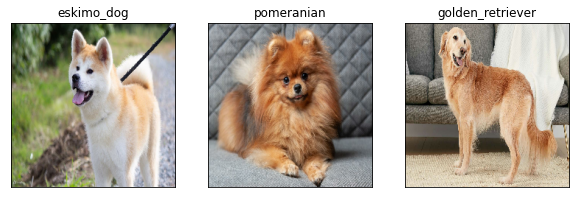

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)